<a href="https://colab.research.google.com/github/2410072/Python-Lesson/blob/main/basic/ensemble/RandomForest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# RandomForest
[sklearn.ensemble.RandomForestClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#sklearn-ensemble-randomforestclassifier)

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# 表示する文字サイズを調整
plt.rc("font", size=20)
plt.rc("legend", fontsize=16)
plt.rc("xtick", labelsize=14)
plt.rc("ytick", labelsize=14)

# 乱数
np.random.seed(777)

# Google　Colaboratory で実行する場合はインストールする
if "google.colab" in str(get_ipython()):
    !pip install japanize_matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 63.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for japanize_matplotlib: filename=japanize_matplotlib-1.1.3-py3-none-any.whl size=4120306 sha256=de14a13c278bd3ad23bd4bec6efeb3de2c4f890c6777fc746d763449e8175658
  Stored in directory: /root/.cache/pip/wheels/c1/f7/9b/418f19a7b9340fc16e071e89efc379aca68d40238b258df53d
Successfully built japanize_matplotlib


# ランダムフォレストを学習
- [sklearn.metrics.roc_auc_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html#sklearn.metrics.roc_auc_score)
- [sklearn.model_selection.train_test_split](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html#sklearn.model_selection.train_test_split)

In [3]:
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

n_features = 20
X, y = make_classification(
    n_samples=2500,
    n_features=n_features,
    n_informative=10,
    n_classes=2,
    n_redundant=0,
    n_clusters_per_class=4,
    random_state=777,
)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=777
)

model = RandomForestClassifier(
    n_estimators=50, max_depth=3, random_state=777, bootstrap=True, oob_score=True
)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
rf_score = roc_auc_score(y_test, y_pred)
print(f"テストデータでのROC-AUC = {rf_score}")

テストデータでのROC-AUC = 0.814573097628059


# ランダムフォレストに含まれる各木の性能を確認する

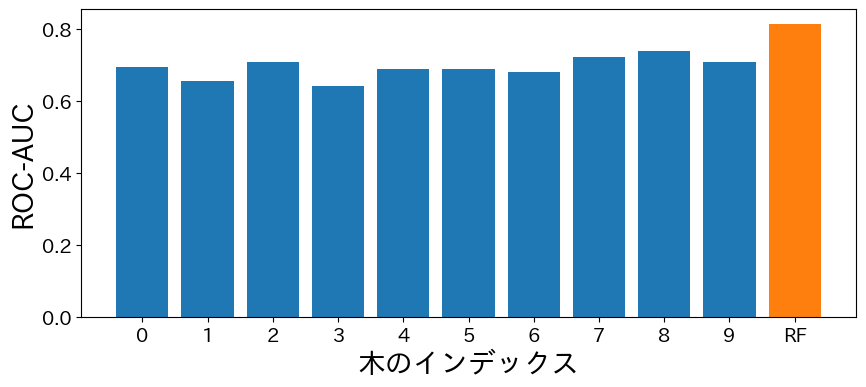

In [4]:
import japanize_matplotlib

estimator_scores = []
for i in range(10):
    estimator = model.estimators_[i]
    estimator_pred = estimator.predict(X_test)
    estimator_scores.append(roc_auc_score(y_test, estimator_pred))

plt.figure(figsize=(10, 4))
bar_index = [i for i in range(len(estimator_scores))]
plt.bar(bar_index, estimator_scores)
plt.bar([10], rf_score)
plt.xticks(bar_index + [10], bar_index + ["RF"])
plt.xlabel("木のインデックス")
plt.ylabel("ROC-AUC")
plt.show()

## 特徴の重要度
### 不純度(impurity)に基づいた重要度

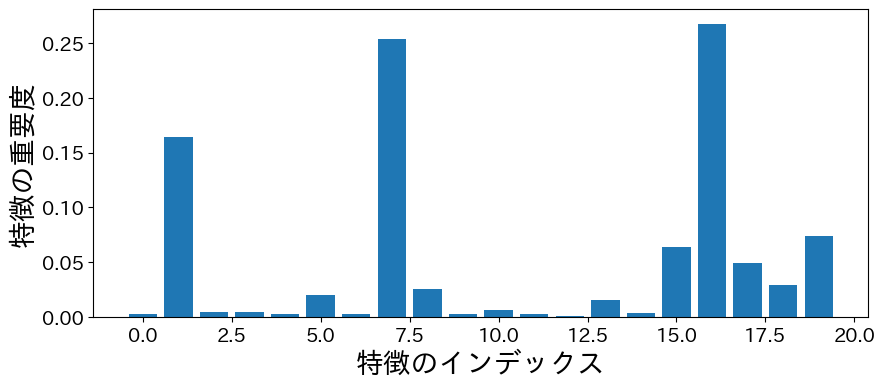

In [5]:
plt.figure(figsize=(10, 4))
feature_index = [i for i in range(n_features)]
plt.bar(feature_index, model.feature_importances_)
plt.xlabel("特徴のインデックス")
plt.ylabel("特徴の重要度")
plt.show()

## permutation importance
[permutation_importance](https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html#sklearn.inspection.permutation_importance)

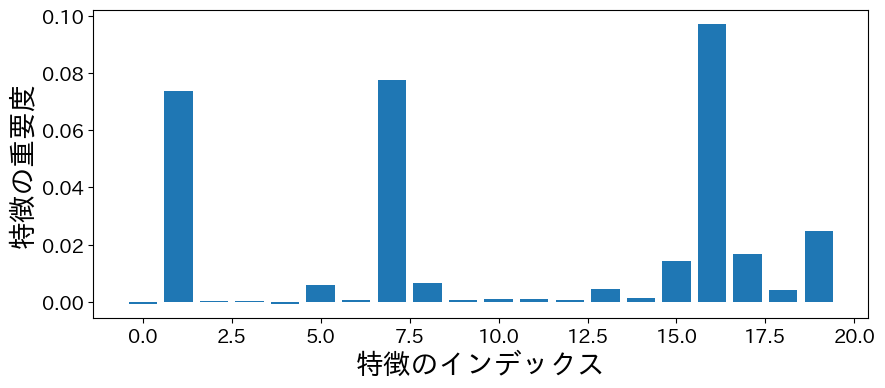

In [6]:
from sklearn.inspection import permutation_importance

p_imp = permutation_importance(
    model, X_train, y_train, n_repeats=10, random_state=77
).importances_mean

plt.figure(figsize=(10, 4))
plt.bar(feature_index, p_imp)
plt.xlabel("特徴のインデックス")
plt.ylabel("特徴の重要度")
plt.show()

# ランダムフォレストに含まれる各木を出力する

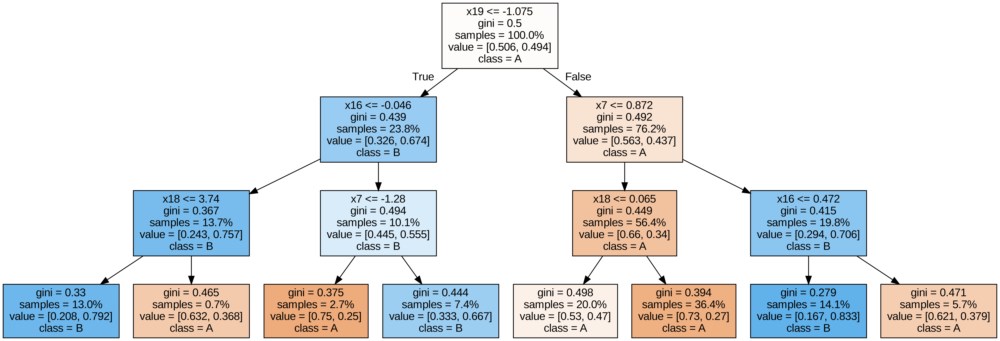

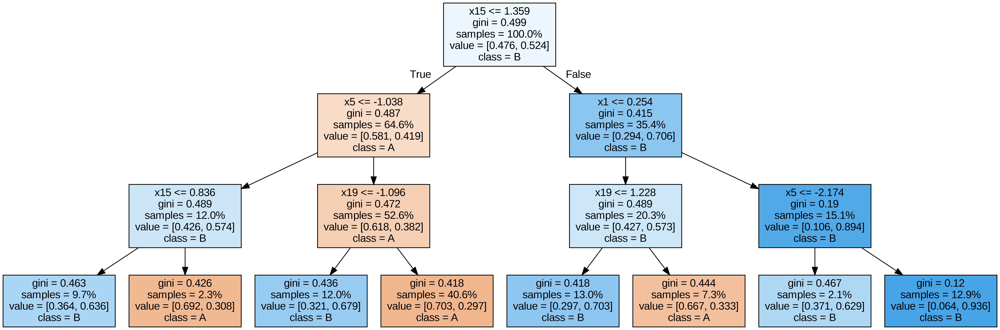

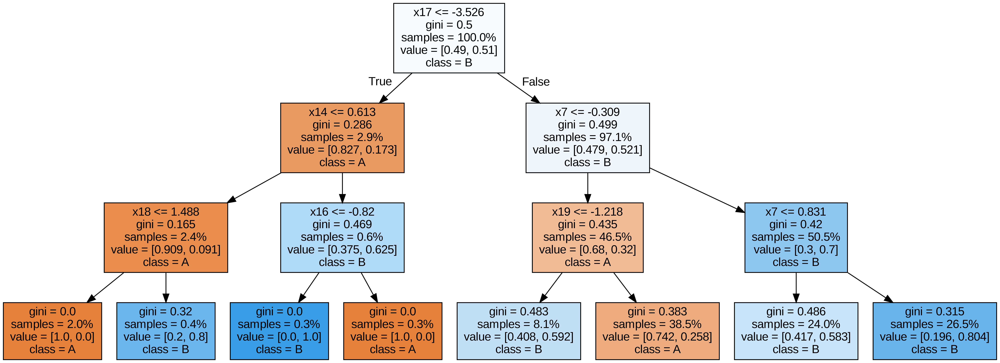

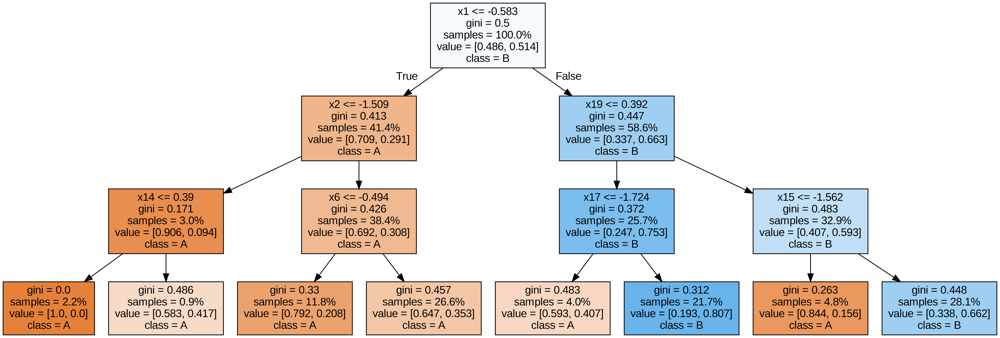

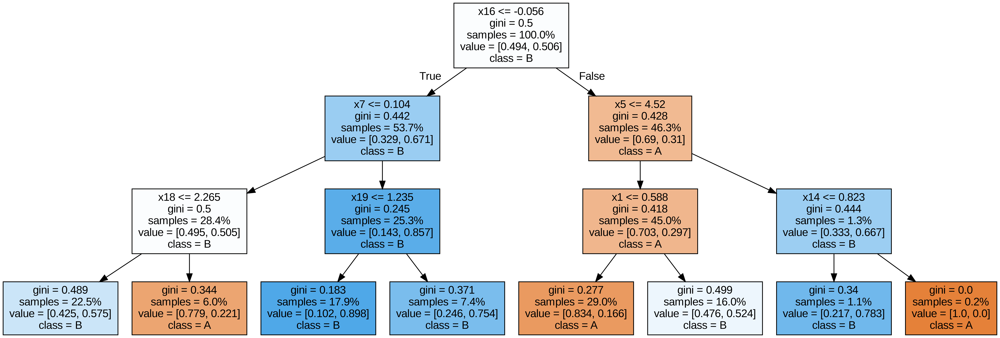

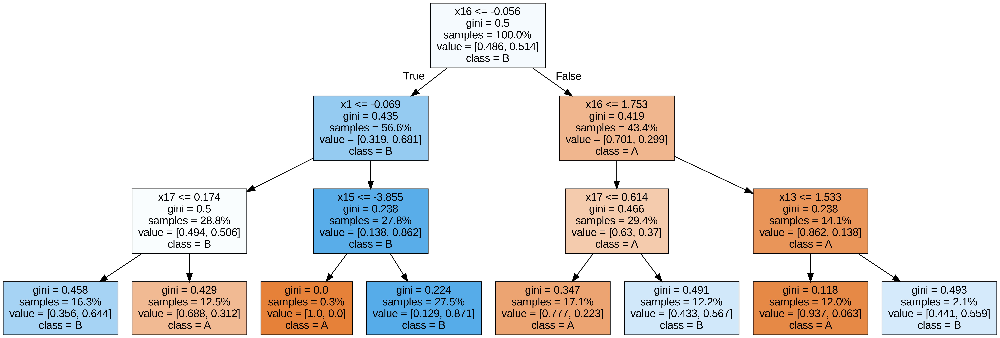

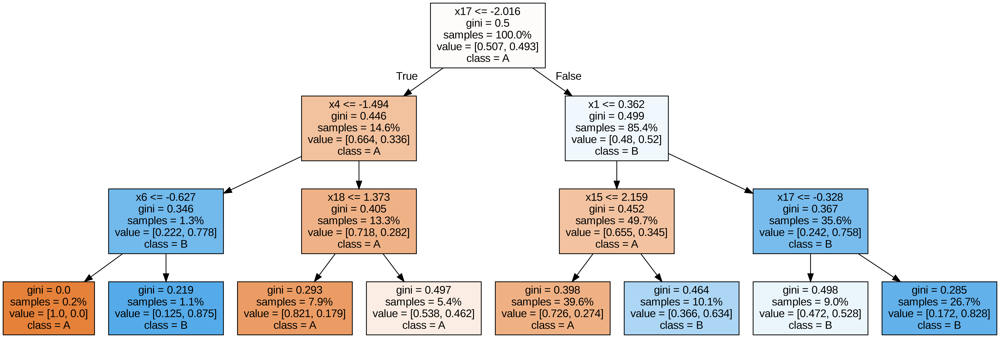

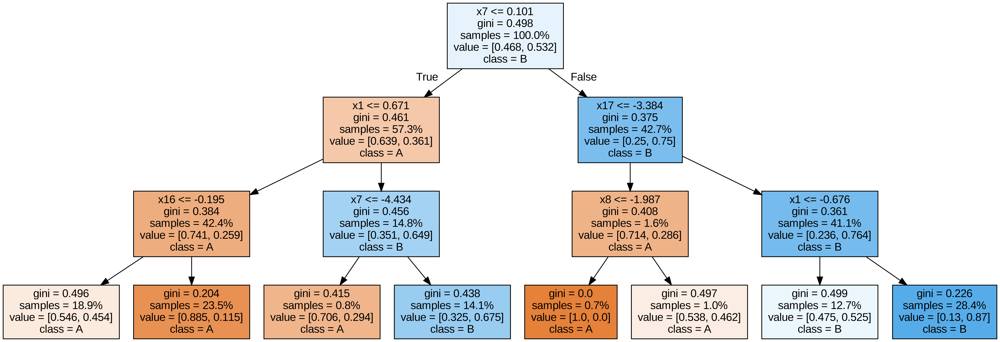

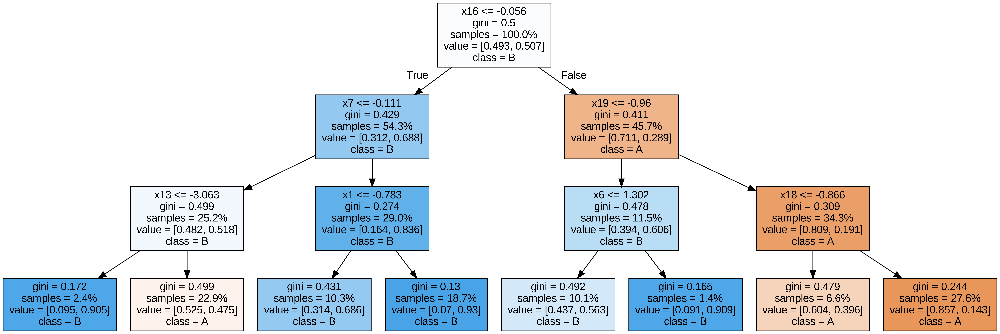

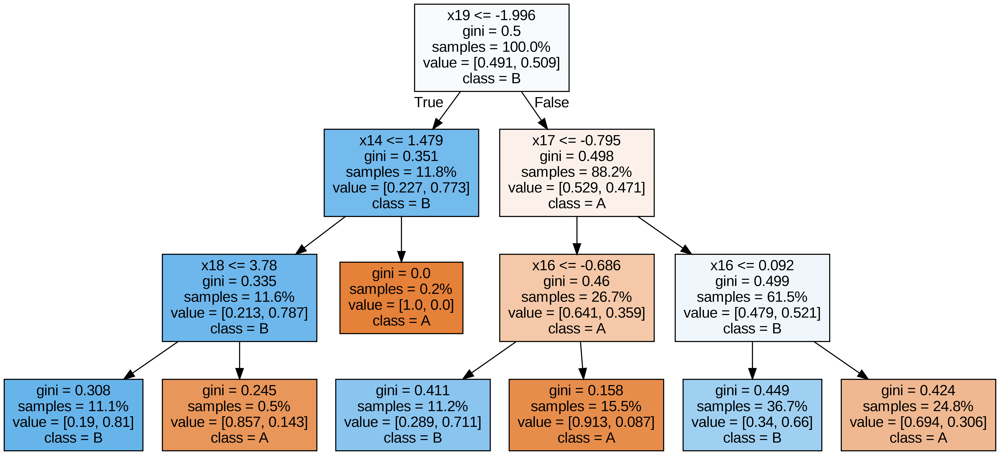

In [7]:
from sklearn.tree import export_graphviz
from subprocess import call
from IPython.display import Image
from IPython.display import display

for i in range(10):
    try:
        estimator = model.estimators_[i]
        export_graphviz(
            estimator,
            out_file=f"tree{i}.dot",
            feature_names=[f"x{i}" for i in range(n_features)],
            class_names=["A", "B"],
            proportion=True,
            filled=True,
        )

        call(["dot", "-Tpng", f"tree{i}.dot", "-o", f"tree{i}.png", "-Gdpi=500"])
        display(Image(filename=f"tree{i}.png"))
    except KeyboardInterrupt:
        # TODO: jupyter bookビルド時に出力に失敗するため一時的に例外処理を挟む
        pass

## OOB(out-of-bag) Score
OOBによる検証とテストデータでの検証結果が近い値を取ることが確認できます。
乱数と木の深さを変えつつ、OOBでのAccuracyとテストデータでのAccuracyを比較します。

In [8]:
from sklearn.metrics import accuracy_score

for i in range(10):
    model_i = RandomForestClassifier(
        n_estimators=50,
        max_depth=3 + i % 2,
        random_state=i,
        bootstrap=True,
        oob_score=True,
    )
    model_i.fit(X_train, y_train)
    y_pred = model_i.predict(X_test)
    oob_score = model_i.oob_score_
    test_score = accuracy_score(y_test, y_pred)
    print(f"OOBでの検証結果＝{oob_score} テストデータでの検証結果＝{test_score}")

OOBでの検証結果＝0.786865671641791 テストデータでの検証結果＝0.8121212121212121
OOBでの検証結果＝0.8101492537313433 テストデータでの検証結果＝0.8363636363636363
OOBでの検証結果＝0.7886567164179105 テストデータでの検証結果＝0.8024242424242424
OOBでの検証結果＝0.8161194029850747 テストデータでの検証結果＝0.8315151515151515
OOBでの検証結果＝0.7910447761194029 テストデータでの検証結果＝0.8072727272727273
OOBでの検証結果＝0.8101492537313433 テストデータでの検証結果＝0.833939393939394
OOBでの検証結果＝0.7814925373134328 テストデータでの検証結果＝0.8133333333333334
OOBでの検証結果＝0.8059701492537313 テストデータでの検証結果＝0.833939393939394
OOBでの検証結果＝0.7832835820895523 テストデータでの検証結果＝0.7951515151515152
OOBでの検証結果＝0.8083582089552239 テストデータでの検証結果＝0.8387878787878787
